# LLM Zero-Shot Baseline for Meme Classification

This notebook evaluates **GPT-4o** and **Gemini 2.5 Flash** on two meme datasets:

**Dataset A — MET-Meme** (HuggingFace `Emmaruyi/met-meme-filtered`)

| Task | Labels |
|------|--------|
| Intention | 1-Interactive, 2-Expressive, 3-Entertaining, 4-Offensive |
| Sentiment | 1-Happiness, 2-Love, 3-Anger, 4-Sorrow, 5-Fear, 6-Hate, 7-Surprise |
| Hate (offensiveness) | 0-Non-offensive, 1-Slightly, 2-Moderately |

**Dataset B — Memotion 7k** (local `data/memotion_dataset_7k/`)

Labels merged for LLM evaluability (see comments in config cell):

| Task | Merged Labels |
|------|--------------|
| Humour | 0-not_funny, 1-funny, 2-hilarious |
| Sarcasm | 0-not_sarcastic, 1-general, 2-twisted |
| Offensive | 0-not_offensive, 1-offensive, 2-hateful |
| Motivational | 0-not_motivational, 1-motivational |
| Sentiment | 0-negative, 1-neutral, 2-positive |

In [2]:
# ── Load API keys from Colab Secrets ────────────────────────────────────────
# In Colab: click the 🔑 icon (left sidebar) → add secrets:
#   OPENAI_API_KEY, GEMINI_API_KEY, OPENROUTER_API_KEY
import os

try:
    from google.colab import userdata
    for _k in ['OPENAI_API_KEY', 'GEMINI_API_KEY', 'OPENROUTER_API_KEY']:
        _v = userdata.get(_k)
        if _v:
            os.environ[_k] = _v
except ImportError:
    pass  # local environment: keys already in os.environ or set manually

for _k in ['OPENAI_API_KEY', 'GEMINI_API_KEY', 'OPENROUTER_API_KEY']:
    print(f'{_k}: {"set" if os.getenv(_k) else "MISSING — add to Colab Secrets"}')

# ── Install / import ──────────────────────────────────────────────────────────
!pip install -q openai google-genai datasets pillow tqdm

import os, io, base64, json, time, random
import numpy as np
from tqdm import tqdm
from PIL import Image
from datasets import load_dataset
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker

In [3]:
# ── API keys ──────────────────────────────────────────────────────────────────
# Keys are loaded from .env by the cell above — do not hard-code them here.
import os
OPENAI_API_KEY = os.environ['OPENAI_API_KEY']
GEMINI_API_KEY = os.environ['GEMINI_API_KEY']

# ── Eval settings ─────────────────────────────────────────────────────────────
N_SAMPLES   = 50        # number of test-set memes to evaluate (set to 340 for full test)
RANDOM_SEED = 42
GPT_MODEL   = 'gpt-4o'
GEMINI_MODEL= 'gemini-2.5-flash'

# ── Label maps ────────────────────────────────────────────────────────────────
INTENTION_MAP  = {1: 'Interactive', 2: 'Expressive', 3: 'Entertaining', 4: 'Offensive'}
SENTIMENT_MAP  = {1: 'Happiness', 2: 'Love', 3: 'Anger', 4: 'Sorrow',
                  5: 'Fear', 6: 'Hate', 7: 'Surprise'}
HATE_MAP       = {0: 'Non-offensive', 1: 'Slightly offensive', 2: 'Moderately offensive'}

TASKS = [
    {
        'name':      'intention',
        'key':       'intention_num',
        'label_map': INTENTION_MAP,
        'choices':   '1=Interactive, 2=Expressive, 3=Entertaining, 4=Offensive',
    },
    {
        'name':      'sentiment',
        'key':       'sentiment_num',
        'label_map': SENTIMENT_MAP,
        'choices':   '1=Happiness, 2=Love, 3=Anger, 4=Sorrow, 5=Fear, 6=Hate, 7=Surprise',
    },
    {
        'name':      'hate',
        'key':       'offensiveness_detection_num',
        'label_map': HATE_MAP,
        'choices':   '0=Non-offensive, 1=Slightly offensive, 2=Moderately offensive',
    },
]

print('Config OK.')
print(f'  Models : {GPT_MODEL}, {GEMINI_MODEL}')
print(f'  Samples: {N_SAMPLES}')


Config OK.
  Models : gpt-4o, gemini-2.5-flash
  Samples: 50


In [4]:
# ── Load dataset & sample ─────────────────────────────────────────────────────
hf = load_dataset('Emmaruyi/met-meme-filtered')
test_split = hf['test']

rng = random.Random(RANDOM_SEED)
indices = rng.sample(range(len(test_split)), min(N_SAMPLES, len(test_split)))
samples = [test_split[i] for i in indices]

print(f'Loaded {len(samples)} samples from test set (total={len(test_split)}).')

# Quick sanity check
s = samples[0]
print(f'  caption    : {s["caption"][:80]}')
print(f'  intention  : {s["intention_num"]}  ({INTENTION_MAP[s["intention_num"]]})')
print(f'  sentiment  : {s["sentiment_num"]}  ({SENTIMENT_MAP[s["sentiment_num"]]})')
print(f'  hate       : {s["offensiveness_detection_num"]}  ({HATE_MAP[s["offensiveness_detection_num"]]})')

Loaded 50 samples from test set (total=340).
  caption    : THIS IS BILL
BILL IS UP ALL NIGHT
BILLWATCHES GAME OF THRONES BEFORE EVERYONE EL
  intention  : 1  (Interactive)
  sentiment  : 2  (Love)
  hate       : 0  (Non-offensive)


In [5]:
# ── Shared helpers ────────────────────────────────────────────────────────────

def pil_to_b64(img: Image.Image, fmt='JPEG') -> str:
    """Encode a PIL image as base64 string."""
    buf = io.BytesIO()
    img.convert('RGB').save(buf, format=fmt)
    return base64.b64encode(buf.getvalue()).decode()


def build_prompt(caption: str, task: dict) -> str:
    return (
        f'You are analyzing an internet meme. '
        f'The meme image is provided. The text overlaid on the meme (caption) is:\n'
        f'"""\n{caption}\n"""\n\n'
        f'Task: classify the meme by its **{task["name"]}**.\n'
        f'Choices: {task["choices"]}\n\n'
        f'Reply with ONLY the integer label (e.g. 1 or 2). No explanation.'
    )


def parse_int(text: str, valid: set) -> int | None:
    """Extract first integer from LLM response and validate it's in valid set."""
    import re
    nums = re.findall(r'\d+', text.strip())
    for n in nums:
        v = int(n)
        if v in valid:
            return v
    return None  # parse failure


print('Helpers defined.')

Helpers defined.


In [6]:
# ── GPT-4o client ─────────────────────────────────────────────────────────────
from openai import OpenAI

oai = OpenAI(api_key=OPENAI_API_KEY)


def gpt_predict(img: Image.Image, caption: str, task: dict) -> int | None:
    b64 = pil_to_b64(img)
    prompt = build_prompt(caption, task)
    valid = set(task['label_map'].keys())
    try:
        resp = oai.chat.completions.create(
            model=GPT_MODEL,
            messages=[
                {
                    'role': 'user',
                    'content': [
                        {'type': 'image_url',
                         'image_url': {'url': f'data:image/jpeg;base64,{b64}', 'detail': 'low'}},
                        {'type': 'text', 'text': prompt},
                    ],
                }
            ],
            max_tokens=10,
            temperature=0,
        )
        raw = resp.choices[0].message.content
        return parse_int(raw, valid)
    except Exception as e:
        print(f'  [GPT error] {e}')
        return None


print('GPT client ready.')

GPT client ready.


In [7]:
# ── Gemini client (google-genai SDK) ─────────────────────────────────────────
from google import genai
from google.genai import types as genai_types

gemini_client = genai.Client(api_key=GEMINI_API_KEY)


def gemini_predict(img: Image.Image, caption: str, task: dict) -> int | None:
    prompt = build_prompt(caption, task)
    valid = set(task['label_map'].keys())
    try:
        resp = gemini_client.models.generate_content(
            model=GEMINI_MODEL,
            contents=[img.convert('RGB'), prompt],
            config=genai_types.GenerateContentConfig(
                max_output_tokens=100,   # 2.5-flash needs more room even for short replies
                temperature=0,
                thinking_config=genai_types.ThinkingConfig(thinking_budget=0),  # disable CoT
            ),
        )
        raw = resp.text
        if not raw:
            fr = resp.candidates[0].finish_reason if resp.candidates else 'unknown'
            print(f'  [Gemini] empty response, finish_reason={fr}')
            return None
        return parse_int(raw, valid)
    except Exception as e:
        print(f'  [Gemini error] {e}')
        return None


print('Gemini client ready.')

Gemini client ready.


In [8]:
# ── Compute accuracy & per-class metrics ──────────────────────────────────────
from collections import defaultdict

def compute_metrics(pairs: list, label_map: dict):
    """
    pairs: list of (pred, gt)  — pred may be None (parse failure)
    Returns dict with overall accuracy, per-class accuracy, parse_failure_rate.
    """
    total = len(pairs)
    failures = sum(1 for p, _ in pairs if p is None)
    valid_pairs = [(p, g) for p, g in pairs if p is not None]

    correct = sum(1 for p, g in valid_pairs if p == g)
    accuracy = correct / total if total else 0   # failures count as wrong

    # Per-class
    class_correct = defaultdict(int)
    class_total   = defaultdict(int)
    for p, g in pairs:
        class_total[g] += 1
        if p == g:
            class_correct[g] += 1

    per_class = {
        label_map[k]: class_correct[k] / class_total[k]
        for k in sorted(class_total)
    }

    return {
        'accuracy':     accuracy,
        'per_class':    per_class,
        'parse_failures': failures,
        'n_total':      total,
    }


In [9]:
# ── Run evaluation ────────────────────────────────────────────────────────────
import json

RESULTS_FILE = 'results/llm_eval_results.json'

if os.path.exists(RESULTS_FILE):
    print(f'Loading cached results from {RESULTS_FILE}...')
    with open(RESULTS_FILE) as f:
        _loaded = json.load(f)
    results = {
        model: {
            task_name: [tuple(p) for p in pairs]
            for task_name, pairs in task_dict.items()
        }
        for model, task_dict in _loaded.items()
    }
    print('Loaded:', {m: len(list(v.values())[0]) for m, v in results.items()})

else:
    results = {
        'GPT-4o':           {t['name']: [] for t in TASKS},
        'Gemini-2.5-Flash': {t['name']: [] for t in TASKS},
    }

    RATE_LIMIT_DELAY = 0.5

    for idx, sample in enumerate(tqdm(samples, desc='Evaluating')):
        img     = sample['image'].convert('RGB')
        caption = sample['caption']

        for task in TASKS:
            gt = sample[task['key']]

            pred_gpt = gpt_predict(img, caption, task)
            results['GPT-4o'][task['name']].append((pred_gpt, gt))
            time.sleep(RATE_LIMIT_DELAY)

            pred_gem = gemini_predict(img, caption, task)
            results['Gemini-2.5-Flash'][task['name']].append((pred_gem, gt))
            time.sleep(RATE_LIMIT_DELAY)

    print('Evaluation complete.')

    with open(RESULTS_FILE, 'w') as f:
        json.dump(results, f, indent=2)
    print(f'Saved: {RESULTS_FILE}')


Loading cached results from results/llm_eval_results.json...
Loaded: {'GPT-4o': 50, 'Gemini-2.5-Flash': 50}


In [10]:
# Compute for all models × tasks
metrics = {}
for model, task_results in results.items():
    metrics[model] = {}
    for task in TASKS:
        m = compute_metrics(task_results[task['name']], task['label_map'])
        metrics[model][task['name']] = m

# Print summary table
print(f'{"Model":<22} {"Task":<12} {"Accuracy":>10}  {"ParseFail":>10}')
print('-' * 58)
for model in metrics:
    for task in TASKS:
        m = metrics[model][task['name']]
        print(f'{model:<22} {task["name"]:<12} {m["accuracy"]:>9.1%}  {m["parse_failures"]:>5}/{m["n_total"]}')

Model                  Task           Accuracy   ParseFail
----------------------------------------------------------
GPT-4o                 intention        52.0%      0/50
GPT-4o                 sentiment        28.0%      0/50
GPT-4o                 hate             76.0%      0/50
Gemini-2.5-Flash       intention        48.0%      0/50
Gemini-2.5-Flash       sentiment        34.0%      0/50
Gemini-2.5-Flash       hate             74.0%      2/50


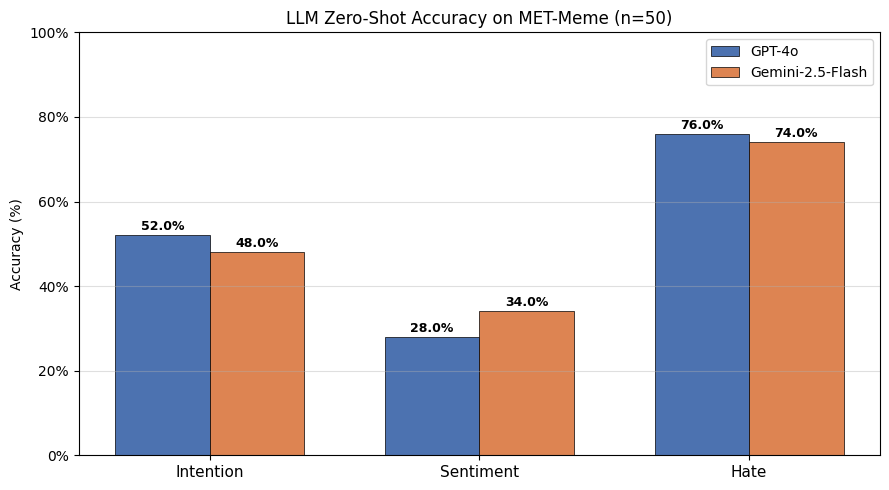

In [11]:
# ── Plot 1: Overall accuracy comparison ───────────────────────────────────────
model_names = list(metrics.keys())
task_names  = [t['name'] for t in TASKS]

x = np.arange(len(task_names))
width = 0.35
colors = ['#4C72B0', '#DD8452']

fig, ax = plt.subplots(figsize=(9, 5))
for i, (model, color) in enumerate(zip(model_names, colors)):
    accs = [metrics[model][t]['accuracy'] * 100 for t in task_names]
    bars = ax.bar(x + i * width - width / 2, accs, width, label=model,
                  color=color, edgecolor='black', linewidth=0.5)
    for bar, acc in zip(bars, accs):
        ax.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 0.5,
                f'{acc:.1f}%', ha='center', va='bottom', fontsize=9, fontweight='bold')

ax.set_xticks(x)
ax.set_xticklabels([t.capitalize() for t in task_names], fontsize=11)
ax.set_ylabel('Accuracy (%)')
ax.set_title(f'LLM Zero-Shot Accuracy on MET-Meme (n={N_SAMPLES})')
ax.set_ylim(0, 100)
ax.legend(fontsize=10)
ax.yaxis.set_major_formatter(mticker.FormatStrFormatter('%d%%'))
ax.grid(axis='y', alpha=0.4)

plt.tight_layout()
plt.show()

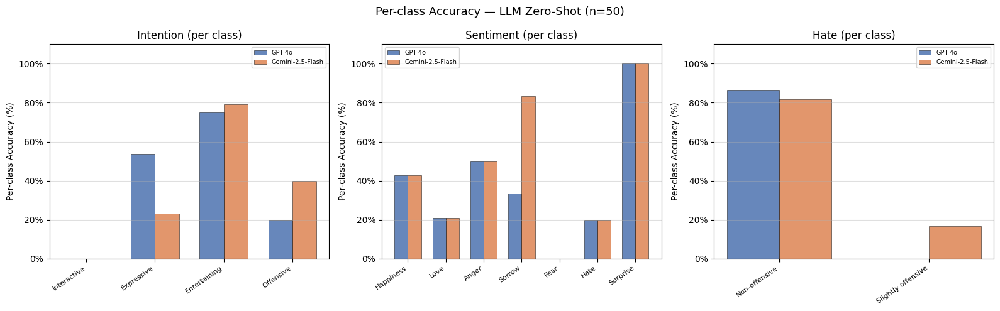

In [12]:
# ── Plot 2: Per-class accuracy for each task ───────────────────────────────────
fig, axes = plt.subplots(1, len(TASKS), figsize=(16, 5))

for ax, task in zip(axes, TASKS):
    all_classes = sorted(
        set().union(*[metrics[m][task['name']]['per_class'].keys() for m in model_names]),
        key=lambda c: list(task['label_map'].values()).index(c)
    )
    x = np.arange(len(all_classes))
    width = 0.35

    for i, (model, color) in enumerate(zip(model_names, colors)):
        pc = metrics[model][task['name']]['per_class']
        accs = [pc.get(c, 0) * 100 for c in all_classes]
        ax.bar(x + i * width - width / 2, accs, width, label=model,
               color=color, edgecolor='black', linewidth=0.4, alpha=0.85)

    ax.set_xticks(x)
    ax.set_xticklabels(all_classes, rotation=35, ha='right', fontsize=8)
    ax.set_ylabel('Per-class Accuracy (%)')
    ax.set_title(f'{task["name"].capitalize()} (per class)')
    ax.set_ylim(0, 110)
    ax.legend(fontsize=7)
    ax.grid(axis='y', alpha=0.4)
    ax.yaxis.set_major_formatter(mticker.FormatStrFormatter('%d%%'))

plt.suptitle(f'Per-class Accuracy — LLM Zero-Shot (n={N_SAMPLES})', fontsize=13)
plt.tight_layout()
plt.show()

Both models wrong on 22/50 samples (intention task).


/var/folders/dl/qk95d0zj23j9sjmtb6_4gh_w0000gn/T/ipykernel_73798/2209009594.py:37: UserWarning: Glyph 20080 (\N{CJK UNIFIED IDEOGRAPH-4E70}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/var/folders/dl/qk95d0zj23j9sjmtb6_4gh_w0000gn/T/ipykernel_73798/2209009594.py:37: UserWarning: Glyph 19981 (\N{CJK UNIFIED IDEOGRAPH-4E0D}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/var/folders/dl/qk95d0zj23j9sjmtb6_4gh_w0000gn/T/ipykernel_73798/2209009594.py:37: UserWarning: Glyph 21040 (\N{CJK UNIFIED IDEOGRAPH-5230}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/var/folders/dl/qk95d0zj23j9sjmtb6_4gh_w0000gn/T/ipykernel_73798/2209009594.py:37: UserWarning: Glyph 21475 (\N{CJK UNIFIED IDEOGRAPH-53E3}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/var/folders/dl/qk95d0zj23j9sjmtb6_4gh_w0000gn/T/ipykernel_73798/2209009594.py:37: UserWarning: Glyph 32617 (\N{CJK UNIFIED IDEOGRAPH-7F69}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/var/folders/dl/qk95

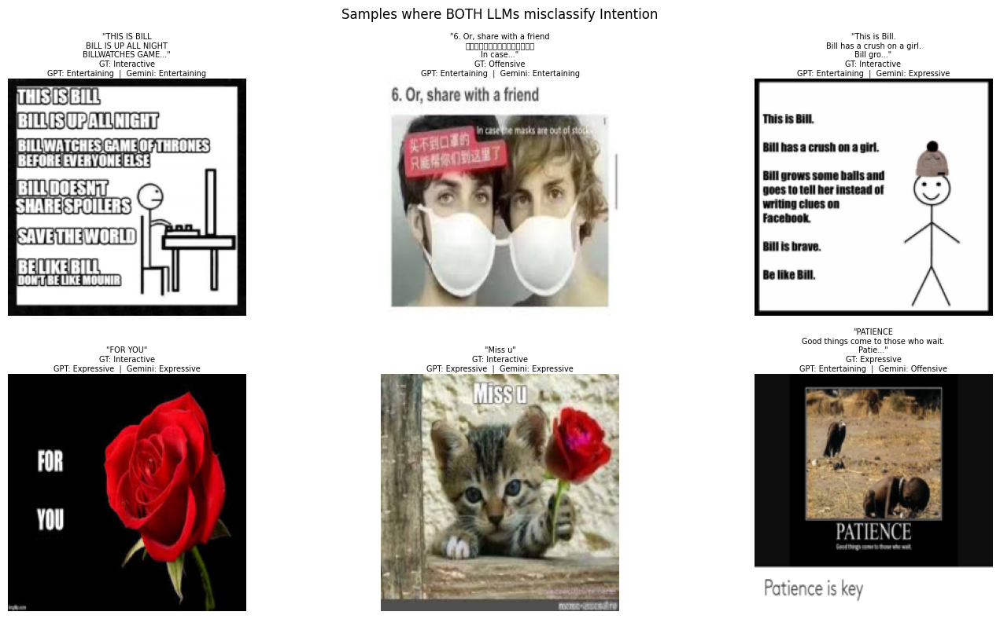

In [13]:
# ── Show sample memes where both models are wrong ─────────────────────────────
task = TASKS[0]  # intention

gpt_pairs = results['GPT-4o'][task['name']]
gem_pairs = results['Gemini-2.5-Flash'][task['name']]

both_wrong_idx = [
    i for i, ((gp, gg), (gep, geg)) in enumerate(zip(gpt_pairs, gem_pairs))
    if (gp is not None and gp != gg) and (gep is not None and gep != geg)
]

print(f'Both models wrong on {len(both_wrong_idx)}/{N_SAMPLES} samples (intention task).')

show_n = min(6, len(both_wrong_idx))
fig, axes = plt.subplots(2, 3, figsize=(15, 8)) if show_n == 6 else plt.subplots(1, max(show_n, 1), figsize=(5 * max(show_n, 1), 4))
axes = np.array(axes).flatten()

for ax, idx in zip(axes, both_wrong_idx[:show_n]):
    s = samples[idx]
    gp, gt  = gpt_pairs[idx]
    gep, _  = gem_pairs[idx]
    ax.imshow(s['image'].convert('RGB'))
    ax.axis('off')
    gt_name  = INTENTION_MAP.get(gt,  str(gt))
    gp_name  = INTENTION_MAP.get(gp,  str(gp))
    gep_name = INTENTION_MAP.get(gep, str(gep))
    cap = s['caption'][:50] + ('...' if len(s['caption']) > 50 else '')
    ax.set_title(
        f'"{cap}"\nGT: {gt_name}\nGPT: {gp_name}  |  Gemini: {gep_name}',
        fontsize=7, pad=3
    )

for ax in axes[show_n:]:
    ax.set_visible(False)

plt.suptitle('Samples where BOTH LLMs misclassify Intention', fontsize=12)
plt.tight_layout()
plt.show()

In [14]:
# ── Final summary table ───────────────────────────────────────────────────────
print('=' * 70)
print(f'LLM ZERO-SHOT BASELINE SUMMARY  (n={N_SAMPLES} test samples)')
print('=' * 70)

for task in TASKS:
    print(f'\n  Task: {task["name"].upper()}')
    print(f'  {"Model":<25} {"Accuracy":>10}  {"ParseFailures":>15}')
    print('  ' + '-' * 55)
    for model in model_names:
        m = metrics[model][task['name']]
        print(f'  {model:<25} {m["accuracy"]:>9.1%}  {m["parse_failures"]:>8}/{m["n_total"]}')
    
    print(f'\n  Per-class breakdown:')
    all_classes = sorted(
        set().union(*[metrics[mod][task['name']]['per_class'].keys() for mod in model_names]),
        key=lambda c: list(task['label_map'].values()).index(c)
    )
    header = f'  {"Class":<22}' + ''.join(f'{m:>20}' for m in model_names)
    print(header)
    print('  ' + '-' * (22 + 20 * len(model_names)))
    for cls in all_classes:
        row = f'  {cls:<22}'
        for model in model_names:
            acc = metrics[model][task['name']]['per_class'].get(cls, None)
            row += f'{(f"{acc:.1%}" if acc is not None else "N/A"):>20}'
        print(row)

print('\n' + '=' * 70)

LLM ZERO-SHOT BASELINE SUMMARY  (n=50 test samples)

  Task: INTENTION
  Model                       Accuracy    ParseFailures
  -------------------------------------------------------
  GPT-4o                        52.0%         0/50
  Gemini-2.5-Flash              48.0%         0/50

  Per-class breakdown:
  Class                               GPT-4o    Gemini-2.5-Flash
  --------------------------------------------------------------
  Interactive                           0.0%                0.0%
  Expressive                           53.8%               23.1%
  Entertaining                         75.0%               79.2%
  Offensive                            20.0%               40.0%

  Task: SENTIMENT
  Model                       Accuracy    ParseFailures
  -------------------------------------------------------
  GPT-4o                        28.0%         0/50
  Gemini-2.5-Flash              34.0%         0/50

  Per-class breakdown:
  Class                               GP

---
## Error Analysis — MET-Meme (Intention & Sentiment)

> Hate task excluded per experiment design.

For each task we look at:
1. **Confusion matrix** — which classes get confused with which
2. **Error rate by class** — how often each class is misclassified
3. **Example memes** where *at least one model* is wrong

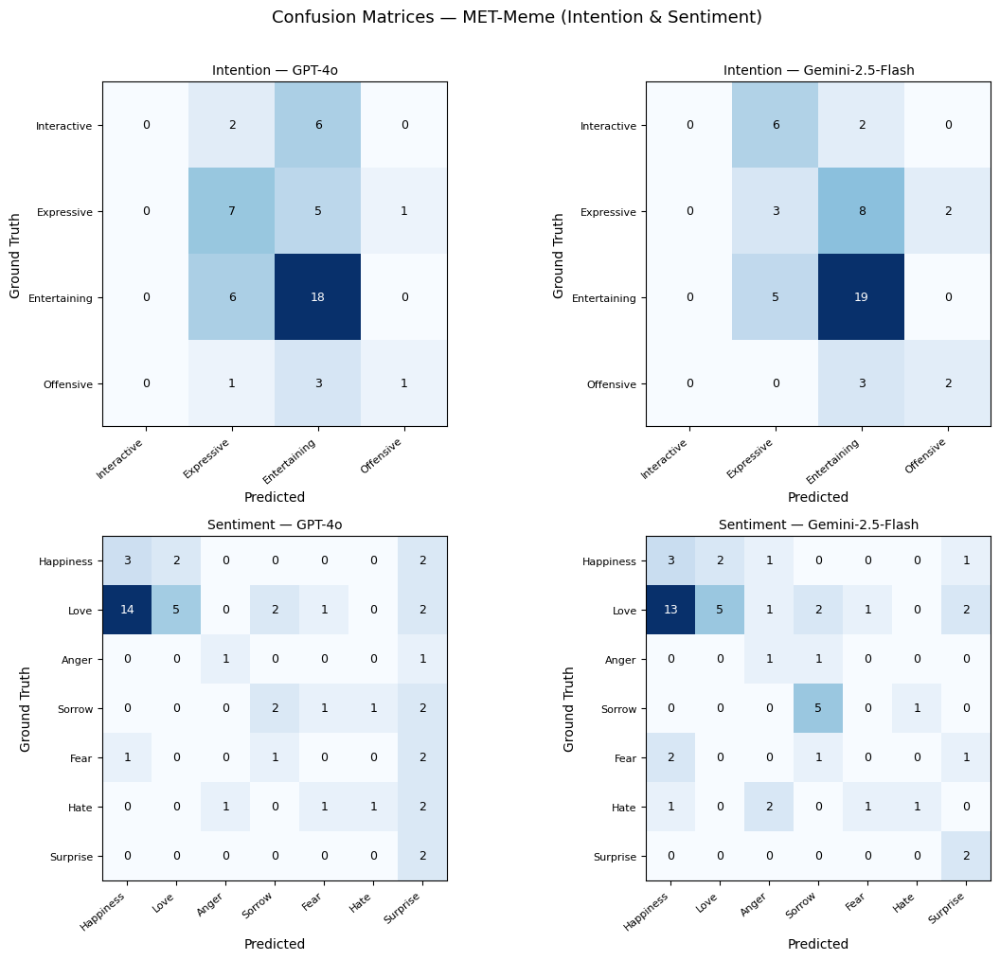


Per-class Error Rate (= 1 − per-class accuracy)

  Task: INTENTION
  Class                                 GPT-4o      Gemini-2.5-Flash  Most confused with (GPT-4o)
  ------------------------------------------------------------------------------------------------
  Interactive                          100.0%               100.0%  → Entertaining (6x)
  Expressive                            46.2%                76.9%  → Entertaining (5x)
  Entertaining                          25.0%                20.8%  → Expressive (6x)
  Offensive                             80.0%                60.0%  → Entertaining (3x)

  Task: SENTIMENT
  Class                                 GPT-4o      Gemini-2.5-Flash  Most confused with (GPT-4o)
  ------------------------------------------------------------------------------------------------
  Happiness                             57.1%                57.1%  → Surprise (2x)
  Love                                  79.2%                79.2%  → Happiness (14x)

In [15]:
# ── MET-Meme Error Analysis: confusion matrices & per-class error rates ────────
from collections import defaultdict
import itertools

ERROR_TASKS = [t for t in TASKS if t['name'] != 'hate']

fig, axes = plt.subplots(
    len(ERROR_TASKS), len(model_names),
    figsize=(6 * len(model_names), 5 * len(ERROR_TASKS))
)
if len(ERROR_TASKS) == 1:
    axes = [axes]

for row_i, task in enumerate(ERROR_TASKS):
    label_map  = task['label_map']
    class_keys = sorted(label_map.keys())
    class_names = [label_map[k] for k in class_keys]
    n_cls = len(class_keys)

    for col_i, model in enumerate(model_names):
        pairs = results[model][task['name']]

        # build confusion matrix (rows=GT, cols=Pred); None pred → last extra col
        cm = np.zeros((n_cls, n_cls), dtype=int)
        for pred, gt in pairs:
            if pred is None:
                continue
            r = class_keys.index(gt)
            c = class_keys.index(pred) if pred in class_keys else -1
            if c >= 0:
                cm[r, c] += 1

        ax = axes[row_i][col_i]
        im = ax.imshow(cm, cmap='Blues')
        ax.set_xticks(range(n_cls)); ax.set_xticklabels(class_names, rotation=40, ha='right', fontsize=8)
        ax.set_yticks(range(n_cls)); ax.set_yticklabels(class_names, fontsize=8)
        ax.set_xlabel('Predicted'); ax.set_ylabel('Ground Truth')
        ax.set_title(f'{task["name"].capitalize()} — {model}', fontsize=10)
        for i, j in itertools.product(range(n_cls), range(n_cls)):
            ax.text(j, i, str(cm[i, j]), ha='center', va='center',
                    color='white' if cm[i, j] > cm.max() * 0.6 else 'black', fontsize=9)

plt.suptitle('Confusion Matrices — MET-Meme (Intention & Sentiment)', fontsize=13, y=1.01)
plt.tight_layout()
plt.show()

# ── Per-class error rate table ────────────────────────────────────────────────
print('\nPer-class Error Rate (= 1 − per-class accuracy)')
for task in ERROR_TASKS:
    label_map = task['label_map']
    class_keys = sorted(label_map.keys())
    print(f'\n  Task: {task["name"].upper()}')
    header = f'  {"Class":<22}' + ''.join(f'{m:>22}' for m in model_names) + f'  {"Most confused with (GPT-4o)":>0}'
    print(header)
    print('  ' + '-' * (22 + 22 * len(model_names) + 30))

    for ck in class_keys:
        cls_name = label_map[ck]
        row = f'  {cls_name:<22}'
        for model in model_names:
            pairs = results[model][task['name']]
            gt_pairs = [(p, g) for p, g in pairs if g == ck]
            if not gt_pairs:
                row += f'{"N/A":>22}'
                continue
            err = sum(1 for p, g in gt_pairs if p != g) / len(gt_pairs)
            row += f'{err:>21.1%}'

        # most confused-with for GPT-4o
        gpt_pairs = [(p, g) for p, g in results['GPT-4o'][task['name']] if g == ck and p is not None and p != g]
        if gpt_pairs:
            from collections import Counter
            top_wrong = Counter(p for p, _ in gpt_pairs).most_common(1)[0]
            row += f'  → {label_map.get(top_wrong[0], str(top_wrong[0]))} ({top_wrong[1]}x)'
        print(row)

/var/folders/dl/qk95d0zj23j9sjmtb6_4gh_w0000gn/T/ipykernel_73798/4259850475.py:50: UserWarning: Glyph 20080 (\N{CJK UNIFIED IDEOGRAPH-4E70}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/var/folders/dl/qk95d0zj23j9sjmtb6_4gh_w0000gn/T/ipykernel_73798/4259850475.py:50: UserWarning: Glyph 19981 (\N{CJK UNIFIED IDEOGRAPH-4E0D}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/var/folders/dl/qk95d0zj23j9sjmtb6_4gh_w0000gn/T/ipykernel_73798/4259850475.py:50: UserWarning: Glyph 21040 (\N{CJK UNIFIED IDEOGRAPH-5230}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/var/folders/dl/qk95d0zj23j9sjmtb6_4gh_w0000gn/T/ipykernel_73798/4259850475.py:50: UserWarning: Glyph 21475 (\N{CJK UNIFIED IDEOGRAPH-53E3}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/var/folders/dl/qk95d0zj23j9sjmtb6_4gh_w0000gn/T/ipykernel_73798/4259850475.py:50: UserWarning: Glyph 32617 (\N{CJK UNIFIED IDEOGRAPH-7F69}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/var/folders/dl/qk95

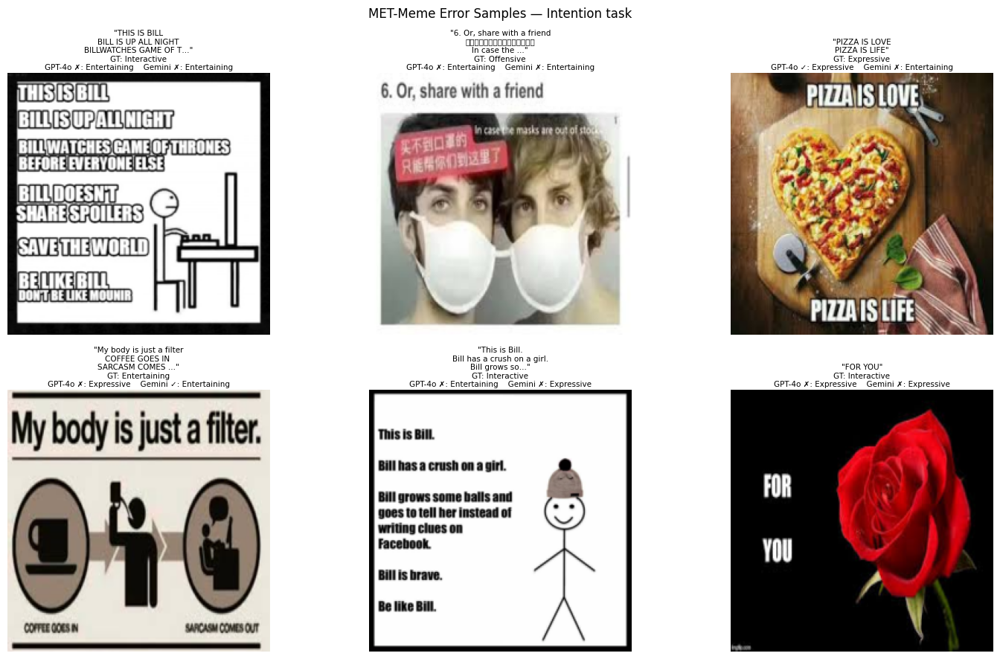

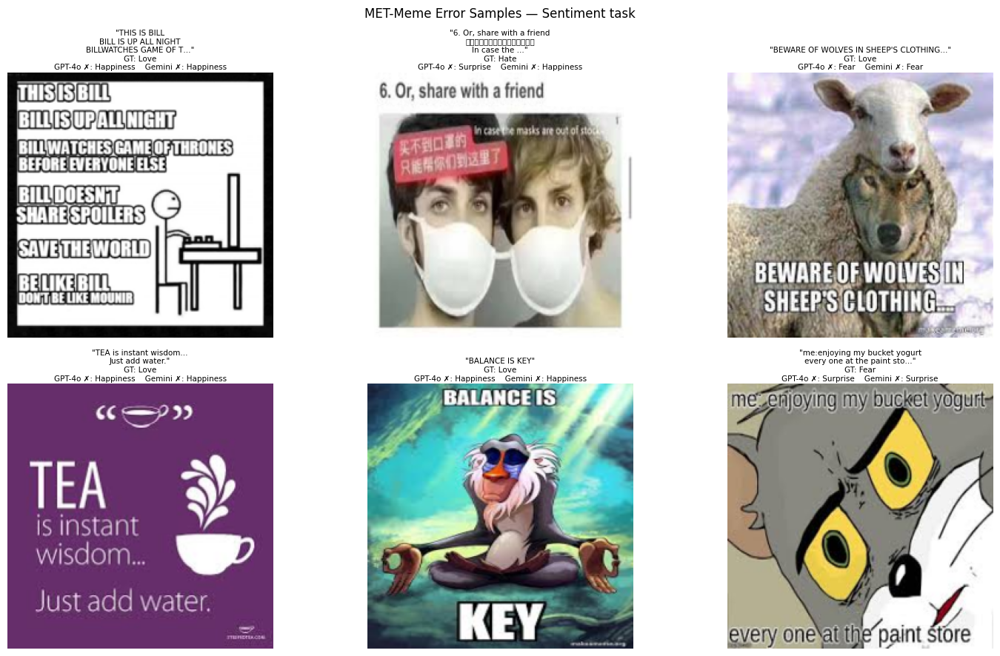

In [16]:
# ── MET-Meme Error Samples ────────────────────────────────────────────────────
# Show up to 4 error examples per task (either model wrong), side-by-side caption + labels

for task in ERROR_TASKS:
    gpt_pairs = results['GPT-4o'][task['name']]
    gem_pairs = results['Gemini-2.5-Flash'][task['name']]
    label_map = task['label_map']

    # indices where at least one model is wrong
    error_idx = [
        i for i, ((gp, gg), (ep, eg)) in enumerate(zip(gpt_pairs, gem_pairs))
        if (gp is not None and gp != gg) or (ep is not None and ep != eg)
    ]

    show_n = min(6, len(error_idx))
    if show_n == 0:
        print(f'No errors for {task["name"]}.')
        continue

    ncols = 3
    nrows = (show_n + ncols - 1) // ncols
    fig, axes = plt.subplots(nrows, ncols, figsize=(ncols * 5, nrows * 4.5))
    axes = np.array(axes).flatten()

    for ax, idx in zip(axes[:show_n], error_idx[:show_n]):
        s = samples[idx]
        gp, gt = gpt_pairs[idx]
        ep, _  = gem_pairs[idx]

        gt_name  = label_map.get(gt,  str(gt))
        gp_name  = label_map.get(gp,  '?') if gp is not None else '?'
        ep_name  = label_map.get(ep,  '?') if ep is not None else '?'

        ax.imshow(s['image'].convert('RGB'))
        ax.axis('off')
        cap = s['caption'][:55] + ('…' if len(s['caption']) > 55 else '')
        gpt_mark  = '✗' if gp != gt else '✓'
        gem_mark  = '✗' if ep != gt else '✓'
        title = (
            f'"{cap}"\n'
            f'GT: {gt_name}\n'
            f'GPT-4o {gpt_mark}: {gp_name}    Gemini {gem_mark}: {ep_name}'
        )
        ax.set_title(title, fontsize=7.5, pad=3)

    for ax in axes[show_n:]:
        ax.set_visible(False)

    plt.suptitle(f'MET-Meme Error Samples — {task["name"].capitalize()} task', fontsize=12)
    plt.tight_layout()
    plt.show()

---
## Reasoning Models Comparison

Re-run the **same MET-Meme sample** (n=50, seed=42) through three reasoning-capable models and compare against the non-reasoning baselines (GPT-4o, Gemini-2.5-Flash w/o CoT):

| Model | Reasoning style |
|-------|----------------|
| **o4-mini** | OpenAI internal chain-of-thought, vision-capable |
| **Gemini-2.5-Flash (thinking)** | Same key as before, `thinking_budget` unlocked |
| **Qwen2.5-VL-Max** | Alibaba DashScope, explicit reasoning steps |

Key question: does CoT reasoning actually help for subjective meme classification tasks?

In [45]:
# ── Reasoning model clients ───────────────────────────────────────────────────
import requests as _requests
from openai import OpenAI as _OpenAI
import certifi

OPENROUTER_API_KEY = os.environ['OPENROUTER_API_KEY']
O4MINI_MODEL  = 'o4-mini'
QWEN3_MODEL   = 'qwen/qwen3-vl-30b-a3b-thinking'   # OpenRouter, vision + thinking

_OR_HEADERS = {
    'Authorization': f'Bearer {OPENROUTER_API_KEY}',
    'Content-Type': 'application/json',
}


def o4mini_predict(img: Image.Image, caption: str, task: dict) -> int | None:
    b64 = pil_to_b64(img)
    prompt = build_prompt(caption, task)
    valid = set(task['label_map'].keys())
    try:
        resp = oai.chat.completions.create(
            model=O4MINI_MODEL,
            messages=[{'role': 'user', 'content': [
                {'type': 'image_url', 'image_url': {'url': f'data:image/jpeg;base64,{b64}', 'detail': 'low'}},
                {'type': 'text', 'text': prompt},
            ]}],
            max_completion_tokens=500,
        )
        return parse_int(resp.choices[0].message.content, valid)
    except Exception as e:
        print(f'  [o4-mini error] {e}')
        return None


def gemini_thinking_predict(img: Image.Image, caption: str, task: dict) -> int | None:
    prompt = build_prompt(caption, task)
    valid = set(task['label_map'].keys())
    try:
        resp = gemini_client.models.generate_content(
            model=GEMINI_MODEL,
            contents=[img.convert('RGB'), prompt],
            config=genai_types.GenerateContentConfig(
                max_output_tokens=1024,
                thinking_config=genai_types.ThinkingConfig(thinking_budget=1024),
            ),
        )
        raw = resp.text
        if not raw:
            return None
        return parse_int(raw, valid)
    except Exception as e:
        print(f'  [Gemini-thinking error] {e}')
        return None


def qwen3_predict(img: Image.Image, caption: str, task: dict) -> int | None:
    """Qwen3-VL-30B thinking via OpenRouter."""
    b64 = pil_to_b64(img)
    prompt = build_prompt(caption, task)
    valid = set(task['label_map'].keys())
    try:
        r = _requests.post(
            'https://openrouter.ai/api/v1/chat/completions',
            headers=_OR_HEADERS,
            json={
                'model': QWEN3_MODEL,
                'messages': [{'role': 'user', 'content': [
                    {'type': 'image_url', 'image_url': {'url': f'data:image/jpeg;base64,{b64}'}},
                    {'type': 'text', 'text': prompt},
                ]}],
                'max_tokens': 800,
            },
            # verify=False,
            verify=certifi.where(), 
            timeout=60,
        )
        data = r.json()
        if 'choices' not in data:
            print(f'  [Qwen3 error] {data}')
            return None
        raw = data['choices'][0]['message']['content']
        return parse_int(raw, valid)
    except Exception as e:
        print(f'  [Qwen3 error] {e}')
        return None


print('Reasoning model clients ready.')
print(f'  o4-mini                   : OpenAI {O4MINI_MODEL}')
print(f'  Gemini-2.5-Flash (CoT)    : {GEMINI_MODEL} thinking_budget=1024')
print(f'  Qwen3-VL-30B (thinking)   : OpenRouter {QWEN3_MODEL}')

Reasoning model clients ready.
  o4-mini                   : OpenAI o4-mini
  Gemini-2.5-Flash (CoT)    : gemini-2.5-flash thinking_budget=1024
  Qwen3-VL-30B (thinking)   : OpenRouter qwen/qwen3-vl-30b-a3b-thinking


In [46]:
# ── Run reasoning model evaluation (MET-Meme, same 50 samples) ───────────────
import json

REASONING_RESULTS_FILE = 'results/llm_reasoning_results.json'
REASONING_DELAY = 1.5

if os.path.exists(REASONING_RESULTS_FILE):
    print(f'Loading cached results from {REASONING_RESULTS_FILE}...')
    with open(REASONING_RESULTS_FILE) as f:
        _loaded = json.load(f)
    reasoning_results = {
        model: {
            task_name: [tuple(p) for p in pairs]
            for task_name, pairs in task_dict.items()
        }
        for model, task_dict in _loaded.items()
    }
    print('Loaded:', {m: len(list(v.values())[0]) for m, v in reasoning_results.items()})

else:
    reasoning_results = {
        'o4-mini':                {t['name']: [] for t in TASKS},
        'Gemini-2.5-Flash (CoT)': {t['name']: [] for t in TASKS},
        'Qwen3-VL-30B (thinking)': {t['name']: [] for t in TASKS},
    }

    for idx, sample in enumerate(tqdm(samples, desc='Reasoning eval')):
        img     = sample['image'].convert('RGB')
        caption = sample['caption']

        for task in TASKS:
            gt = sample[task['key']]

            pred_o4 = o4mini_predict(img, caption, task)
            reasoning_results['o4-mini'][task['name']].append((pred_o4, gt))
            time.sleep(REASONING_DELAY)

            pred_gct = gemini_thinking_predict(img, caption, task)
            reasoning_results['Gemini-2.5-Flash (CoT)'][task['name']].append((pred_gct, gt))
            time.sleep(REASONING_DELAY)

            pred_qw = qwen3_predict(img, caption, task)
            reasoning_results['Qwen3-VL-30B (thinking)'][task['name']].append((pred_qw, gt))
            time.sleep(REASONING_DELAY)

    print('Reasoning evaluation complete.')

    with open(REASONING_RESULTS_FILE, 'w') as f:
        json.dump(reasoning_results, f, indent=2)
    print(f'Saved: {REASONING_RESULTS_FILE}')


Reasoning eval:  42%|████▏     | 21/50 [11:58<16:00, 33.12s/it]

  [Gemini-thinking error] 503 UNAVAILABLE. {'error': {'code': 503, 'message': 'This model is currently experiencing high demand. Spikes in demand are usually temporary. Please try again later.', 'status': 'UNAVAILABLE'}}


Reasoning eval:  54%|█████▍    | 27/50 [15:40<13:57, 36.41s/it]

  [Qwen3 error] 'NoneType' object has no attribute 'strip'


Reasoning eval: 100%|██████████| 50/50 [29:19<00:00, 35.19s/it]

Reasoning evaluation complete.
Saved: llm_reasoning_results.json


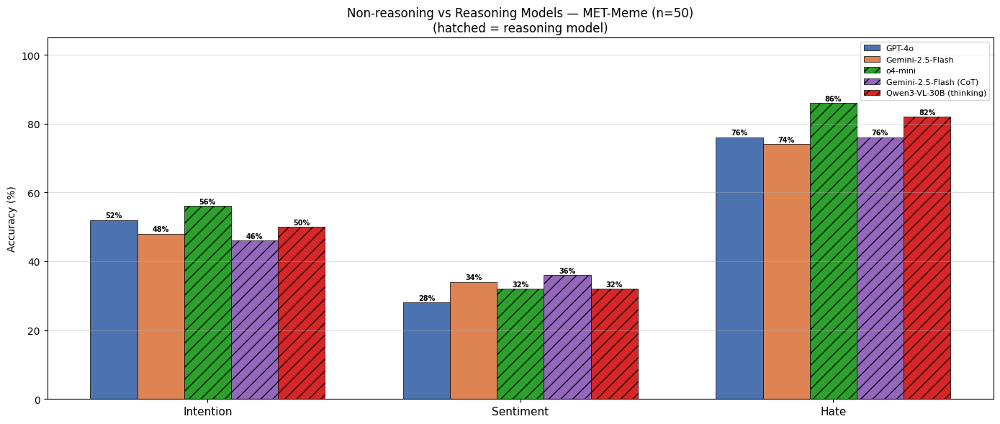

REASONING vs NON-REASONING — MET-Meme (n=50)
Model                              intention     sentiment          hate
---------------------------------------------------------------------------
GPT-4o                                52.0%        28.0%        76.0%
Gemini-2.5-Flash                      48.0%        34.0%        74.0%
o4-mini [R]                           56.0%        32.0%        86.0%
Gemini-2.5-Flash (CoT) [R]            46.0%        36.0%        76.0%
Qwen3-VL-30B (thinking) [R]           50.0%        32.0%        82.0%

[R] = reasoning model


In [47]:
# ── Reasoning vs Non-reasoning comparison ────────────────────────────────────
reasoning_metrics = {}
for model, task_results in reasoning_results.items():
    reasoning_metrics[model] = {}
    for task in TASKS:
        reasoning_metrics[model][task['name']] = compute_metrics(
            task_results[task['name']], task['label_map']
        )

all_models = {
    'GPT-4o':                  metrics['GPT-4o'],
    'Gemini-2.5-Flash':        metrics['Gemini-2.5-Flash'],
    'o4-mini':                 reasoning_metrics['o4-mini'],
    'Gemini-2.5-Flash (CoT)':  reasoning_metrics['Gemini-2.5-Flash (CoT)'],
    'Qwen3-VL-30B (thinking)': reasoning_metrics['Qwen3-VL-30B (thinking)'],
}

model_names_all  = list(all_models.keys())
reasoning_flag   = [False, False, True, True, True]
task_names       = [t['name'] for t in TASKS]
bar_colors       = ['#4C72B0', '#DD8452', '#2ca02c', '#9467bd', '#d62728']

x     = np.arange(len(task_names))
width = 0.15

fig, ax = plt.subplots(figsize=(14, 6))
for i, (model, color, is_r) in enumerate(zip(model_names_all, bar_colors, reasoning_flag)):
    accs   = [all_models[model][t]['accuracy'] * 100 for t in task_names]
    offset = (i - len(model_names_all) / 2 + 0.5) * width
    bars   = ax.bar(x + offset, accs, width, label=model, color=color,
                    edgecolor='black', linewidth=0.5, hatch='//' if is_r else '')
    for bar, acc in zip(bars, accs):
        ax.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 0.3,
                f'{acc:.0f}%', ha='center', va='bottom', fontsize=7, fontweight='bold')

ax.set_xticks(x)
ax.set_xticklabels([t.capitalize() for t in task_names], fontsize=11)
ax.set_ylabel('Accuracy (%)')
ax.set_title(f'Non-reasoning vs Reasoning Models — MET-Meme (n={N_SAMPLES})\n(hatched = reasoning model)')
ax.set_ylim(0, 105)
ax.legend(fontsize=8, loc='upper right')
ax.grid(axis='y', alpha=0.4)
plt.tight_layout()
plt.show()

# ── Summary table ─────────────────────────────────────────────────────────────
print('=' * 75)
print(f'REASONING vs NON-REASONING — MET-Meme (n={N_SAMPLES})')
print('=' * 75)
header = f'{"Model":<30}' + ''.join(f'{t["name"]:>14}' for t in TASKS)
print(header)
print('-' * 75)
for model, m_dict in all_models.items():
    tag = ' [R]' if reasoning_flag[model_names_all.index(model)] else '    '
    row = f'{model+tag:<30}'
    for task in TASKS:
        row += f'{m_dict[task["name"]]["accuracy"]:>13.1%}'
    print(row)
print('\n[R] = reasoning model')

---
## Dataset B — Memotion 7k

Local dataset at `../data/memotion_dataset_7k/`. Five tasks, labels merged as follows:

- **Humour**: `not_funny`→0 | `funny`+`very_funny`→1 | `hilarious`→2
  - *Why*: `funny` vs `very_funny` boundary is too subjective for reliable LLM or human annotation
- **Sarcasm**: `not_sarcastic`→0 | `general`→1 | `twisted_meaning`+`very_twisted`→2
  - *Why*: degree of "twistedness" is hard to distinguish; `twisted_meaning` = indirect irony, `very_twisted` = extreme/dark irony
- **Offensive**: `not_offensive`→0 | `slight`+`very_offensive`→1 | `hateful_offensive`→2
  - *Why*: `hateful_offensive` (n=221) is a qualitatively different category (targets a group); merging `slight`+`very_offensive` keeps 3 meaningful tiers
- **Motivational**: binary — `not_motivational`→0 | `motivational`→1
  - *What it means*: does the meme intend to inspire/encourage? (e.g. fitness memes, positive affirmations)
- **Sentiment**: `very_negative`+`negative`→0 | `neutral`→1 | `positive`+`very_positive`→2
  - *Why*: LLMs struggle to reliably distinguish degree (very_negative vs negative)

In [17]:
# ── Memotion 7k config ────────────────────────────────────────────────────────
import pandas as pd
from PIL import Image as PILImage

MEMOTION_DIR = '/Users/ruyiyang/Documents/courseware/2026_Spring/mas60/mmai_project/data/memotion_dataset_7k'
MEMOTION_IMG_DIR = os.path.join(MEMOTION_DIR, 'images')
MEMOTION_N_SAMPLES = 50

# ── Label merge functions ─────────────────────────────────────────────────────
def merge_humour(v):
    if v == 'not_funny':   return 0
    if v == 'hilarious':   return 2
    return 1  # funny + very_funny

def merge_sarcasm(v):
    if v == 'not_sarcastic': return 0
    if v == 'general':       return 1
    return 2  # twisted_meaning + very_twisted

def merge_offensive(v):
    if v == 'not_offensive':    return 0
    if v == 'hateful_offensive': return 2
    return 1  # slight + very_offensive

def merge_motivational(v):
    return 1 if v == 'motivational' else 0

def merge_sentiment(v):
    if v in ('negative', 'very_negative'): return 0
    if v == 'neutral':                     return 1
    return 2  # positive + very_positive

# ── Task definitions ──────────────────────────────────────────────────────────
MEMOTION_TASKS = [
    {
        'name':      'humour',
        'col':       'humour',
        'merge_fn':  merge_humour,
        'label_map': {0: 'not_funny', 1: 'funny', 2: 'hilarious'},
        'choices':   '0=not_funny, 1=funny (includes very_funny), 2=hilarious',
    },
    {
        'name':      'sarcasm',
        'col':       'sarcasm',
        'merge_fn':  merge_sarcasm,
        'label_map': {0: 'not_sarcastic', 1: 'general_sarcasm', 2: 'twisted'},
        'choices':   '0=not_sarcastic, 1=general sarcasm, 2=twisted/very twisted meaning',
    },
    {
        'name':      'offensive',
        'col':       'offensive',
        'merge_fn':  merge_offensive,
        'label_map': {0: 'not_offensive', 1: 'offensive', 2: 'hateful'},
        'choices':   '0=not_offensive, 1=offensive (slight to very), 2=hateful_offensive',
    },
    {
        'name':      'motivational',
        'col':       'motivational',
        'merge_fn':  merge_motivational,
        'label_map': {0: 'not_motivational', 1: 'motivational'},
        'choices':   '0=not_motivational, 1=motivational (inspires/encourages)',
    },
    {
        'name':      'sentiment',
        'col':       'overall_sentiment',
        'merge_fn':  merge_sentiment,
        'label_map': {0: 'negative', 1: 'neutral', 2: 'positive'},
        'choices':   '0=negative (includes very_negative), 1=neutral, 2=positive (includes very_positive)',
    },
]

# ── Load & sample ─────────────────────────────────────────────────────────────
df = pd.read_csv(os.path.join(MEMOTION_DIR, 'labels.csv'))

rng2 = random.Random(RANDOM_SEED + 1)
mem_indices = rng2.sample(range(len(df)), min(MEMOTION_N_SAMPLES, len(df)))
mem_samples = [df.iloc[i] for i in mem_indices]

print(f'Memotion 7k: loaded {len(mem_samples)} samples (total={len(df)})')
print(f'Tasks: {[t["name"] for t in MEMOTION_TASKS]}')

# Sanity check
row = mem_samples[0]
print(f'\nSample 0:')
print(f'  image      : {row["image_name"]}')
print(f'  caption    : {str(row["text_corrected"])[:80]}')
for t in MEMOTION_TASKS:
    raw = row[t['col']]
    merged = t['merge_fn'](raw)
    print(f'  {t["name"]:<14}: {raw} → {merged} ({t["label_map"][merged]})')

Memotion 7k: loaded 50 samples (total=6992)
Tasks: ['humour', 'sarcasm', 'offensive', 'motivational', 'sentiment']

Sample 0:
  image      : image_316.jpg
  caption    : MAINSTREAM METAL SALES METAL TRENCHES imgflip.com
  humour        : hilarious → 2 (hilarious)
  sarcasm       : general → 1 (general_sarcasm)
  offensive     : very_offensive → 1 (offensive)
  motivational  : motivational → 1 (motivational)
  sentiment     : neutral → 1 (neutral)


In [18]:
RATE_LIMIT_DELAY=1.5

In [19]:
# ── Memotion prompt builder ───────────────────────────────────────────────────
def build_memotion_prompt(caption: str, task: dict) -> str:
    return (
        f'You are analyzing an internet meme. '
        f'The meme image is provided. The text in/on the meme is:\n'
        f'"""\n{caption}\n"""\n\n'
        f'Task: classify the meme by its **{task["name"]}**.\n'
        f'Choices: {task["choices"]}\n\n'
        f'Reply with ONLY the integer label (e.g. 0 or 1). No explanation.'
    )


# ── Run Memotion evaluation ───────────────────────────────────────────────────
import json

MEM_RESULTS_FILE = 'results/memotion_eval_results.json'

if os.path.exists(MEM_RESULTS_FILE):
    print(f'Loading cached results from {MEM_RESULTS_FILE}...')
    with open(MEM_RESULTS_FILE) as f:
        _loaded = json.load(f)
    mem_results = {
        model: {
            task_name: [tuple(p) for p in pairs]
            for task_name, pairs in task_dict.items()
        }
        for model, task_dict in _loaded.items()
    }
    print('Loaded:', {m: len(list(v.values())[0]) for m, v in mem_results.items()})

else:
    mem_results = {
        'GPT-4o':           {t['name']: [] for t in MEMOTION_TASKS},
        'Gemini-2.5-Flash': {t['name']: [] for t in MEMOTION_TASKS},
    }

    for idx, row in enumerate(tqdm(mem_samples, desc='Memotion eval')):
        img_path = os.path.join(MEMOTION_IMG_DIR, row['image_name'])
        try:
            img = PILImage.open(img_path).convert('RGB')
        except Exception as e:
            print(f'  [skip] {row["image_name"]}: {e}')
            for t in MEMOTION_TASKS:
                mem_results['GPT-4o'][t['name']].append((None, t['merge_fn'](row[t['col']])))
                mem_results['Gemini-2.5-Flash'][t['name']].append((None, t['merge_fn'](row[t['col']])))
            continue

        caption = str(row['text_corrected']) if pd.notna(row['text_corrected']) else str(row['text_ocr'])

        for task in MEMOTION_TASKS:
            gt    = task['merge_fn'](row[task['col']])
            valid = set(task['label_map'].keys())
            prompt = build_memotion_prompt(caption, task)

            # GPT-4o
            try:
                b64 = pil_to_b64(img)
                resp = oai.chat.completions.create(
                    model=GPT_MODEL,
                    messages=[{'role': 'user', 'content': [
                        {'type': 'image_url', 'image_url': {'url': f'data:image/jpeg;base64,{b64}', 'detail': 'low'}},
                        {'type': 'text', 'text': prompt},
                    ]}],
                    max_tokens=10, temperature=0,
                )
                pred_gpt = parse_int(resp.choices[0].message.content, valid)
            except Exception as e:
                print(f'  [GPT error] {e}')
                pred_gpt = None
            mem_results['GPT-4o'][task['name']].append((pred_gpt, gt))
            time.sleep(RATE_LIMIT_DELAY)

            # Gemini
            try:
                gresp = gemini_client.models.generate_content(
                    model=GEMINI_MODEL,
                    contents=[img, prompt],
                    config=genai_types.GenerateContentConfig(
                        max_output_tokens=100, temperature=0,
                        thinking_config=genai_types.ThinkingConfig(thinking_budget=0),
                    ),
                )
                raw = gresp.text
                pred_gem = parse_int(raw, valid) if raw else None
            except Exception as e:
                print(f'  [Gemini error] {e}')
                pred_gem = None
            mem_results['Gemini-2.5-Flash'][task['name']].append((pred_gem, gt))
            time.sleep(RATE_LIMIT_DELAY)

    print('Memotion evaluation complete.')

    with open(MEM_RESULTS_FILE, 'w') as f:
        json.dump(mem_results, f, indent=2)
    print(f'Saved: {MEM_RESULTS_FILE}')


Loading cached results from results/memotion_eval_results.json...
Loaded: {'GPT-4o': 50, 'Gemini-2.5-Flash': 50}


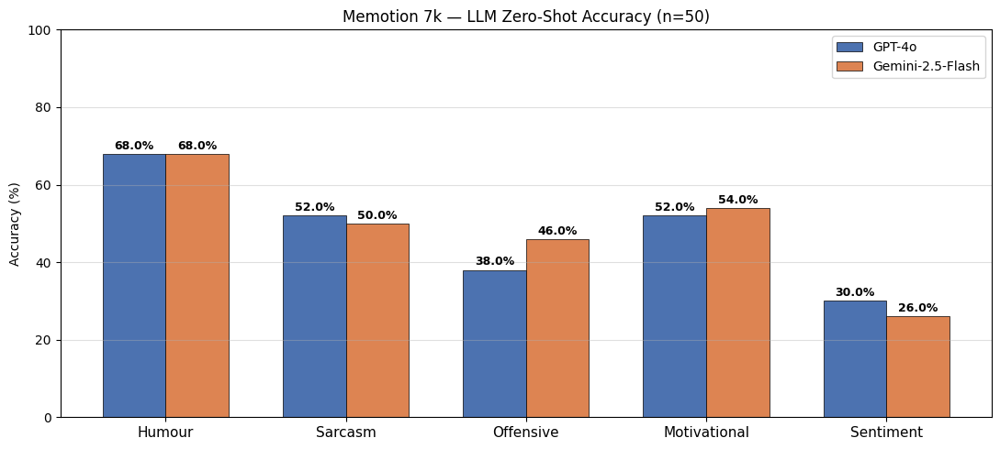

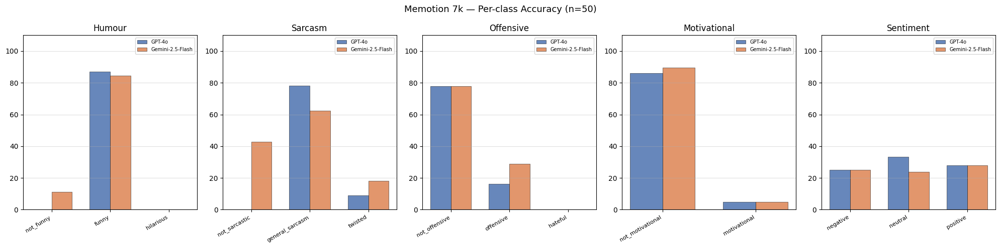

MEMOTION 7k ZERO-SHOT SUMMARY  (n=50)
Model                  Task             Accuracy   ParseFail
------------------------------------------------------------
GPT-4o                 humour             68.0%      0/50
GPT-4o                 sarcasm            52.0%      0/50
GPT-4o                 offensive          38.0%      0/50
GPT-4o                 motivational       52.0%      0/50
GPT-4o                 sentiment          30.0%      0/50
Gemini-2.5-Flash       humour             68.0%      0/50
Gemini-2.5-Flash       sarcasm            50.0%      0/50
Gemini-2.5-Flash       offensive          46.0%      0/50
Gemini-2.5-Flash       motivational       54.0%      0/50
Gemini-2.5-Flash       sentiment          26.0%      0/50


In [20]:
# ── Memotion metrics & plots ──────────────────────────────────────────────────
mem_metrics = {}
for model, task_results in mem_results.items():
    mem_metrics[model] = {}
    for task in MEMOTION_TASKS:
        m = compute_metrics(task_results[task['name']], task['label_map'])
        mem_metrics[model][task['name']] = m

model_names = ['GPT-4o', 'Gemini-2.5-Flash']
colors = ['#4C72B0', '#DD8452']

# ── Plot: overall accuracy ────────────────────────────────────────────────────
task_names_mem = [t['name'] for t in MEMOTION_TASKS]
x = np.arange(len(task_names_mem))
width = 0.35

fig, ax = plt.subplots(figsize=(11, 5))
for i, (model, color) in enumerate(zip(model_names, colors)):
    accs = [mem_metrics[model][t]['accuracy'] * 100 for t in task_names_mem]
    bars = ax.bar(x + i * width - width / 2, accs, width, label=model,
                  color=color, edgecolor='black', linewidth=0.5)
    for bar, acc in zip(bars, accs):
        ax.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 0.5,
                f'{acc:.1f}%', ha='center', va='bottom', fontsize=9, fontweight='bold')

ax.set_xticks(x)
ax.set_xticklabels([t.capitalize() for t in task_names_mem], fontsize=11)
ax.set_ylabel('Accuracy (%)')
ax.set_title(f'Memotion 7k — LLM Zero-Shot Accuracy (n={MEMOTION_N_SAMPLES})')
ax.set_ylim(0, 100)
ax.legend(fontsize=10)
ax.grid(axis='y', alpha=0.4)
plt.tight_layout()
plt.show()

# ── Plot: per-class accuracy ──────────────────────────────────────────────────
fig, axes = plt.subplots(1, len(MEMOTION_TASKS), figsize=(20, 5))
for ax, task in zip(axes, MEMOTION_TASKS):
    all_classes = list(task['label_map'].values())
    x = np.arange(len(all_classes))
    for i, (model, color) in enumerate(zip(model_names, colors)):
        pc = mem_metrics[model][task['name']]['per_class']
        accs = [pc.get(c, 0) * 100 for c in all_classes]
        ax.bar(x + i * width - width / 2, accs, width, label=model,
               color=color, edgecolor='black', linewidth=0.4, alpha=0.85)
    ax.set_xticks(x)
    ax.set_xticklabels(all_classes, rotation=30, ha='right', fontsize=8)
    ax.set_title(f'{task["name"].capitalize()}')
    ax.set_ylim(0, 110)
    ax.legend(fontsize=7)
    ax.grid(axis='y', alpha=0.4)

plt.suptitle(f'Memotion 7k — Per-class Accuracy (n={MEMOTION_N_SAMPLES})', fontsize=13)
plt.tight_layout()
plt.show()

# ── Summary table ─────────────────────────────────────────────────────────────
print('=' * 70)
print(f'MEMOTION 7k ZERO-SHOT SUMMARY  (n={MEMOTION_N_SAMPLES})')
print('=' * 70)
print(f'{"Model":<22} {"Task":<14} {"Accuracy":>10}  {"ParseFail":>10}')
print('-' * 60)
for model in model_names:
    for task in MEMOTION_TASKS:
        m = mem_metrics[model][task['name']]
        print(f'{model:<22} {task["name"]:<14} {m["accuracy"]:>9.1%}  {m["parse_failures"]:>5}/{m["n_total"]}')

In [21]:
# 这个数据集其实更好一点
# 但是sentiment分类不够明确（只有positive， negative，neural）

In [22]:
# ── Memotion reasoning model evaluation ──────────────────────────────────────
import json
from concurrent.futures import ThreadPoolExecutor

MEM_REASONING_RESULTS_FILE = 'results/memotion_reasoning_results.json'
REASONING_DELAY = 0.5  # between samples; 3 APIs now run in parallel

if os.path.exists(MEM_REASONING_RESULTS_FILE):
    print(f'Loading cached results from {MEM_REASONING_RESULTS_FILE}...')
    with open(MEM_REASONING_RESULTS_FILE) as f:
        _loaded = json.load(f)
    mem_reasoning_results = {
        model: {
            task_name: [tuple(p) for p in pairs]
            for task_name, pairs in task_dict.items()
        }
        for model, task_dict in _loaded.items()
    }
    print('Loaded:', {m: len(list(v.values())[0]) for m, v in mem_reasoning_results.items()})

else:
    mem_reasoning_results = {
        'o4-mini':                 {t['name']: [] for t in MEMOTION_TASKS},
        'Gemini-2.5-Flash (CoT)':  {t['name']: [] for t in MEMOTION_TASKS},
        'Qwen3-VL-30B (thinking)': {t['name']: [] for t in MEMOTION_TASKS},
    }

    def _call_o4mini(b64, prompt, valid):
        try:
            resp = oai.chat.completions.create(
                model=O4MINI_MODEL,
                messages=[{'role': 'user', 'content': [
                    {'type': 'image_url', 'image_url': {'url': f'data:image/jpeg;base64,{b64}', 'detail': 'low'}},
                    {'type': 'text', 'text': prompt},
                ]}],
                max_completion_tokens=500,
            )
            return parse_int(resp.choices[0].message.content, valid)
        except Exception as e:
            print(f'  [o4-mini error] {e}')
            return None

    def _call_gemini_cot(img, prompt, valid):
        try:
            gresp = gemini_client.models.generate_content(
                model=GEMINI_MODEL,
                contents=[img, prompt],
                config=genai_types.GenerateContentConfig(
                    max_output_tokens=1024,
                    thinking_config=genai_types.ThinkingConfig(thinking_budget=1024),
                ),
            )
            raw = gresp.text
            return parse_int(raw, valid) if raw else None
        except Exception as e:
            print(f'  [Gemini-CoT error] {e}')
            return None

    def _call_qwen3(b64, prompt, valid):
        try:
            r = _requests.post(
                'https://openrouter.ai/api/v1/chat/completions',
                headers=_OR_HEADERS,
                json={
                    'model': QWEN3_MODEL,
                    'messages': [{'role': 'user', 'content': [
                        {'type': 'image_url', 'image_url': {'url': f'data:image/jpeg;base64,{b64}'}},
                        {'type': 'text', 'text': prompt},
                    ]}],
                    'max_tokens': 800,
                },
                verify=certifi.where(),
                timeout=60,
            )
            data = r.json()
            raw = data['choices'][0]['message']['content'] if 'choices' in data else None
            return parse_int(raw, valid) if raw else None
        except Exception as e:
            print(f'  [Qwen3 error] {e}')
            return None

    for idx, row in enumerate(tqdm(mem_samples, desc='Memotion reasoning eval')):
        img_path = os.path.join(MEMOTION_IMG_DIR, row['image_name'])
        try:
            img = PILImage.open(img_path).convert('RGB')
        except Exception as e:
            print(f'  [skip] {row["image_name"]}: {e}')
            for t in MEMOTION_TASKS:
                gt = t['merge_fn'](row[t['col']])
                for m in mem_reasoning_results:
                    mem_reasoning_results[m][t['name']].append((None, gt))
            continue

        caption = str(row['text_corrected']) if pd.notna(row['text_corrected']) else str(row['text_ocr'])
        b64 = pil_to_b64(img)

        for task in MEMOTION_TASKS:
            gt     = task['merge_fn'](row[task['col']])
            valid  = set(task['label_map'].keys())
            prompt = build_memotion_prompt(caption, task)

            with ThreadPoolExecutor(max_workers=3) as ex:
                f_o4  = ex.submit(_call_o4mini,    b64, prompt, valid)
                f_gem = ex.submit(_call_gemini_cot, img, prompt, valid)
                f_qw  = ex.submit(_call_qwen3,      b64, prompt, valid)
                pred_o4  = f_o4.result()
                pred_gct = f_gem.result()
                pred_qw  = f_qw.result()

            mem_reasoning_results['o4-mini'][task['name']].append((pred_o4,  gt))
            mem_reasoning_results['Gemini-2.5-Flash (CoT)'][task['name']].append((pred_gct, gt))
            mem_reasoning_results['Qwen3-VL-30B (thinking)'][task['name']].append((pred_qw,  gt))

            time.sleep(REASONING_DELAY)

    print('Memotion reasoning evaluation complete.')

    with open(MEM_REASONING_RESULTS_FILE, 'w') as f:
        json.dump(mem_reasoning_results, f, indent=2)
    print(f'Saved: {MEM_REASONING_RESULTS_FILE}')


Loading cached results from results/memotion_reasoning_results.json...
Loaded: {'o4-mini': 50, 'Gemini-2.5-Flash (CoT)': 50, 'Qwen3-VL-30B (thinking)': 50}


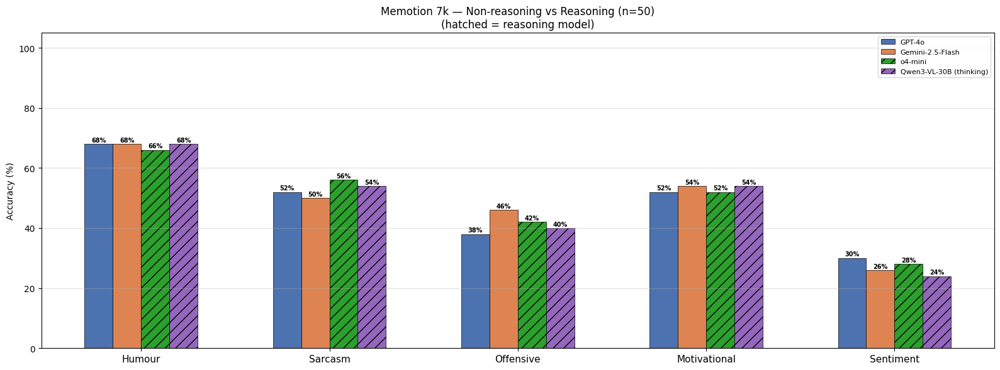

MEMOTION 7k — REASONING vs NON-REASONING (n=50)
Model                               humour     sarcasm   offensivemotivational   sentiment
--------------------------------------------------------------------------------
GPT-4o                              68.0%      52.0%      38.0%      52.0%      30.0%
Gemini-2.5-Flash                    68.0%      50.0%      46.0%      54.0%      26.0%
o4-mini [R]                         66.0%      56.0%      42.0%      52.0%      28.0%
Qwen3-VL-30B (thinking) [R]         68.0%      54.0%      40.0%      54.0%      24.0%

[R] = reasoning model


In [23]:
# ── Memotion reasoning metrics & comparison plot ──────────────────────────────
mem_r_metrics = {}
for model, task_results in mem_reasoning_results.items():
    mem_r_metrics[model] = {}
    for task in MEMOTION_TASKS:
        mem_r_metrics[model][task['name']] = compute_metrics(
            task_results[task['name']], task['label_map']
        )

mem_all_models = {
    'GPT-4o':                  mem_metrics['GPT-4o'],
    'Gemini-2.5-Flash':        mem_metrics['Gemini-2.5-Flash'],
    'o4-mini':                 mem_r_metrics['o4-mini'],
    # 'Gemini-2.5-Flash (CoT)':  mem_r_metrics['Gemini-2.5-Flash (CoT)'],
    'Qwen3-VL-30B (thinking)': mem_r_metrics['Qwen3-VL-30B (thinking)'],
}

mem_model_names  = list(mem_all_models.keys())
mem_reasoning_flag = [False, False, True, True, True]
task_names_mem   = [t['name'] for t in MEMOTION_TASKS]
bar_colors       = ['#4C72B0', '#DD8452', '#2ca02c', '#9467bd', '#d62728']

x     = np.arange(len(task_names_mem))
width = 0.15

fig, ax = plt.subplots(figsize=(16, 6))
for i, (model, color, is_r) in enumerate(zip(mem_model_names, bar_colors, mem_reasoning_flag)):
    accs   = [mem_all_models[model][t]['accuracy'] * 100 for t in task_names_mem]
    offset = (i - len(mem_model_names) / 2 + 0.5) * width
    bars   = ax.bar(x + offset, accs, width, label=model, color=color,
                    edgecolor='black', linewidth=0.5, hatch='//' if is_r else '')
    for bar, acc in zip(bars, accs):
        ax.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 0.3,
                f'{acc:.0f}%', ha='center', va='bottom', fontsize=7, fontweight='bold')

ax.set_xticks(x)
ax.set_xticklabels([t.capitalize() for t in task_names_mem], fontsize=11)
ax.set_ylabel('Accuracy (%)')
ax.set_title(f'Memotion 7k — Non-reasoning vs Reasoning (n={MEMOTION_N_SAMPLES})\n(hatched = reasoning model)')
ax.set_ylim(0, 105)
ax.legend(fontsize=8, loc='upper right')
ax.grid(axis='y', alpha=0.4)
plt.tight_layout()
plt.show()

# ── Summary table ─────────────────────────────────────────────────────────────
print('=' * 80)
print(f'MEMOTION 7k — REASONING vs NON-REASONING (n={MEMOTION_N_SAMPLES})')
print('=' * 80)
header = f'{"Model":<30}' + ''.join(f'{t["name"]:>12}' for t in MEMOTION_TASKS)
print(header)
print('-' * 80)
for model, m_dict in mem_all_models.items():
    tag = ' [R]' if mem_reasoning_flag[mem_model_names.index(model)] else '    '
    row = f'{model+tag:<30}'
    for task in MEMOTION_TASKS:
        row += f'{m_dict[task["name"]]["accuracy"]:>11.1%}'
    print(row)
print('\n[R] = reasoning model')


---
## Error Analysis — Memotion 7k

For each of the five tasks we show:
1. **Confusion matrix** (GPT-4o & Gemini-2.5-Flash)
2. **Per-class error rate** with most-confused target
3. **Example memes** where at least one model is wrong

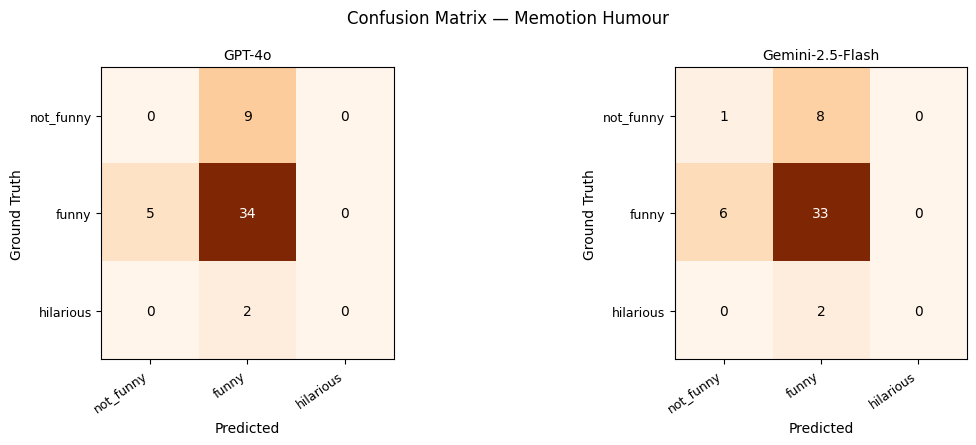

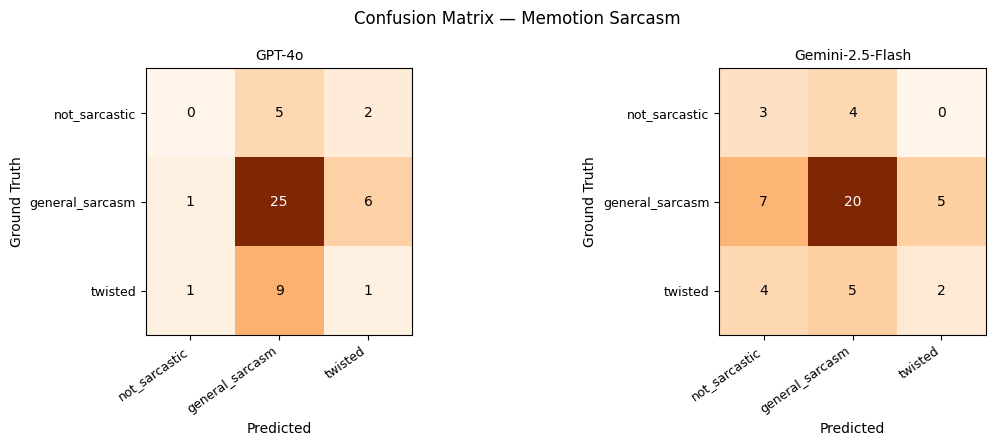

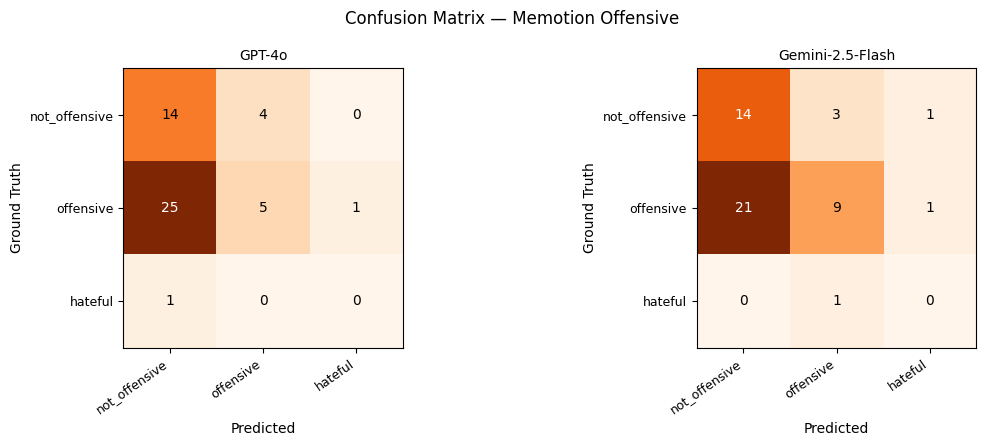

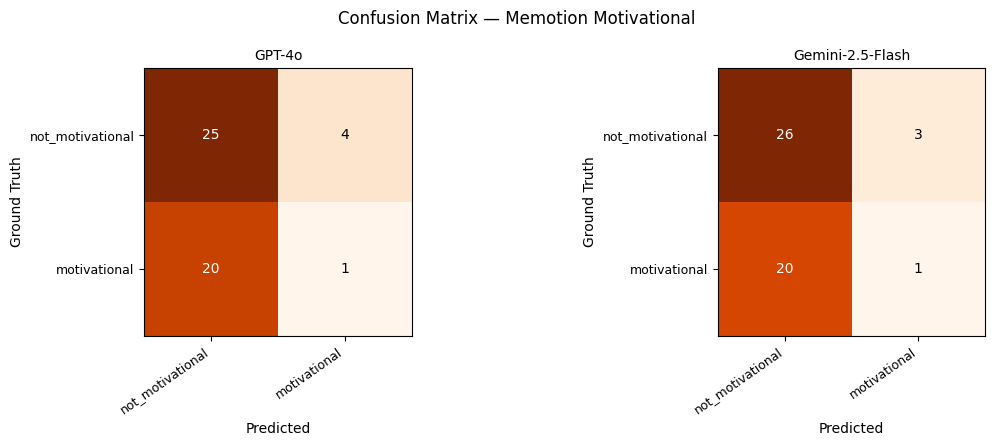

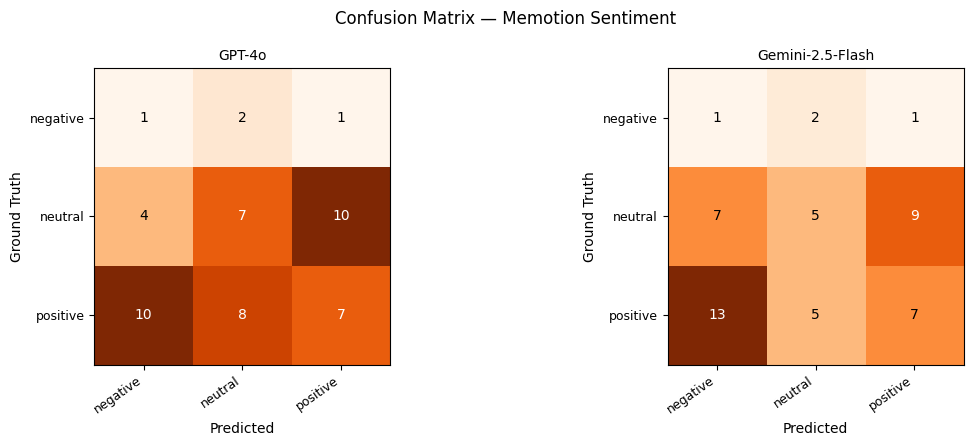

Per-class Error Rate — Memotion 7k

  Task: HUMOUR
  Class                                 GPT-4o      Gemini-2.5-Flash  Most confused with (GPT-4o)
  --------------------------------------------------------------------------------------------------
  not_funny                            100.0%                88.9%  → funny (9x)
  funny                                 12.8%                15.4%  → not_funny (5x)
  hilarious                            100.0%               100.0%  → funny (2x)

  Task: SARCASM
  Class                                 GPT-4o      Gemini-2.5-Flash  Most confused with (GPT-4o)
  --------------------------------------------------------------------------------------------------
  not_sarcastic                        100.0%                57.1%  → general_sarcasm (5x)
  general_sarcasm                       21.9%                37.5%  → twisted (6x)
  twisted                               90.9%                81.8%  → general_sarcasm (9x)

  Task: OFFENSIVE
  C

In [24]:
# ── Memotion Error Analysis: confusion matrices & per-class error rates ────────
import itertools
from collections import Counter

mem_model_names_base = ['GPT-4o', 'Gemini-2.5-Flash']

for task in MEMOTION_TASKS:
    label_map  = task['label_map']
    class_keys = sorted(label_map.keys())
    class_names = [label_map[k] for k in class_keys]
    n_cls = len(class_keys)

    fig, axes = plt.subplots(1, 2, figsize=(12, 4.5))
    for col_i, model in enumerate(mem_model_names_base):
        pairs = mem_results[model][task['name']]

        cm = np.zeros((n_cls, n_cls), dtype=int)
        for pred, gt in pairs:
            if pred is None:
                continue
            if gt not in class_keys or pred not in class_keys:
                continue
            cm[class_keys.index(gt), class_keys.index(pred)] += 1

        ax = axes[col_i]
        ax.imshow(cm, cmap='Oranges')
        ax.set_xticks(range(n_cls)); ax.set_xticklabels(class_names, rotation=35, ha='right', fontsize=9)
        ax.set_yticks(range(n_cls)); ax.set_yticklabels(class_names, fontsize=9)
        ax.set_xlabel('Predicted'); ax.set_ylabel('Ground Truth')
        ax.set_title(f'{model}', fontsize=10)
        for i, j in itertools.product(range(n_cls), range(n_cls)):
            ax.text(j, i, str(cm[i, j]), ha='center', va='center',
                    color='white' if cm[i, j] > cm.max() * 0.6 else 'black', fontsize=10)

    plt.suptitle(f'Confusion Matrix — Memotion {task["name"].capitalize()}', fontsize=12)
    plt.tight_layout()
    plt.show()

# ── Per-class error rate summary ──────────────────────────────────────────────
print('Per-class Error Rate — Memotion 7k')
for task in MEMOTION_TASKS:
    label_map  = task['label_map']
    class_keys = sorted(label_map.keys())
    print(f'\n  Task: {task["name"].upper()}')
    header = f'  {"Class":<22}' + ''.join(f'{m:>22}' for m in mem_model_names_base) + '  Most confused with (GPT-4o)'
    print(header)
    print('  ' + '-' * (22 + 22 * len(mem_model_names_base) + 32))

    for ck in class_keys:
        cls_name = label_map[ck]
        row = f'  {cls_name:<22}'
        for model in mem_model_names_base:
            pairs = mem_results[model][task['name']]
            gt_pairs = [(p, g) for p, g in pairs if g == ck]
            if not gt_pairs:
                row += f'{"N/A":>22}'
                continue
            err = sum(1 for p, g in gt_pairs if p != g) / len(gt_pairs)
            row += f'{err:>21.1%}'

        # most-confused target for GPT-4o
        gpt_errors = [p for p, g in mem_results['GPT-4o'][task['name']]
                      if g == ck and p is not None and p != g and p in class_keys]
        if gpt_errors:
            top = Counter(gpt_errors).most_common(1)[0]
            row += f'  → {label_map[top[0]]} ({top[1]}x)'
        print(row)

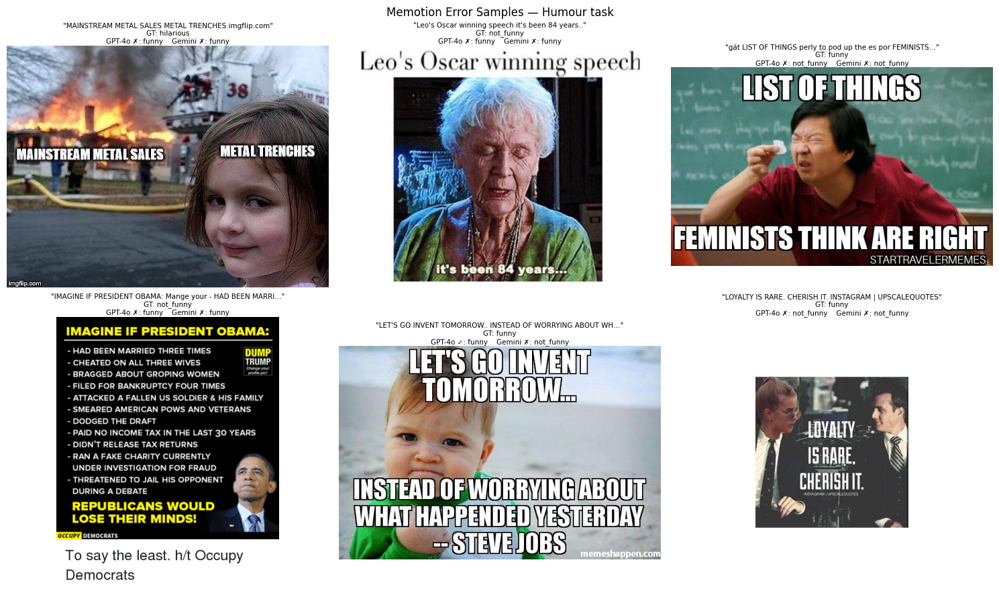

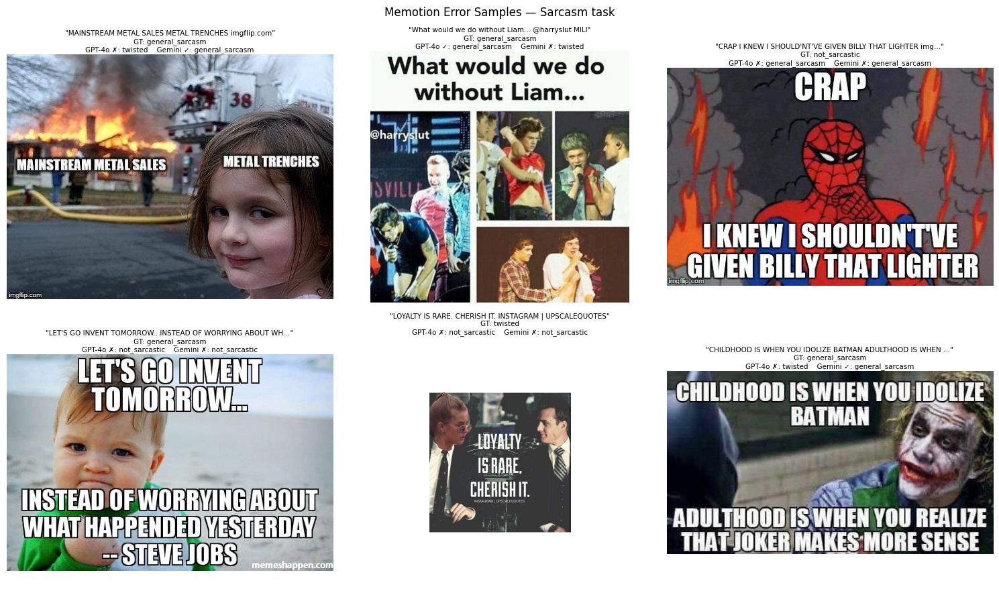

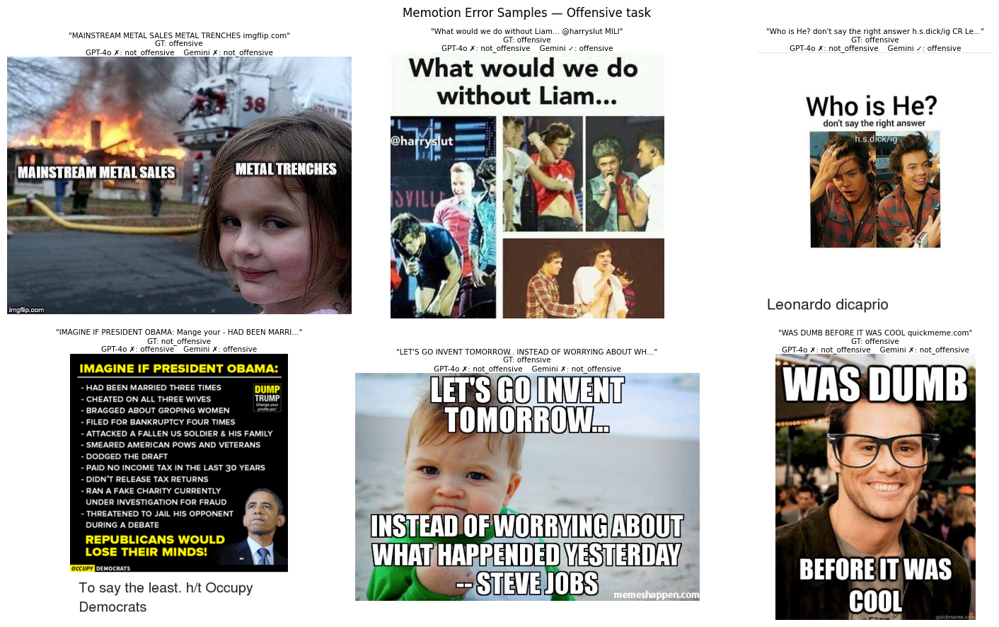

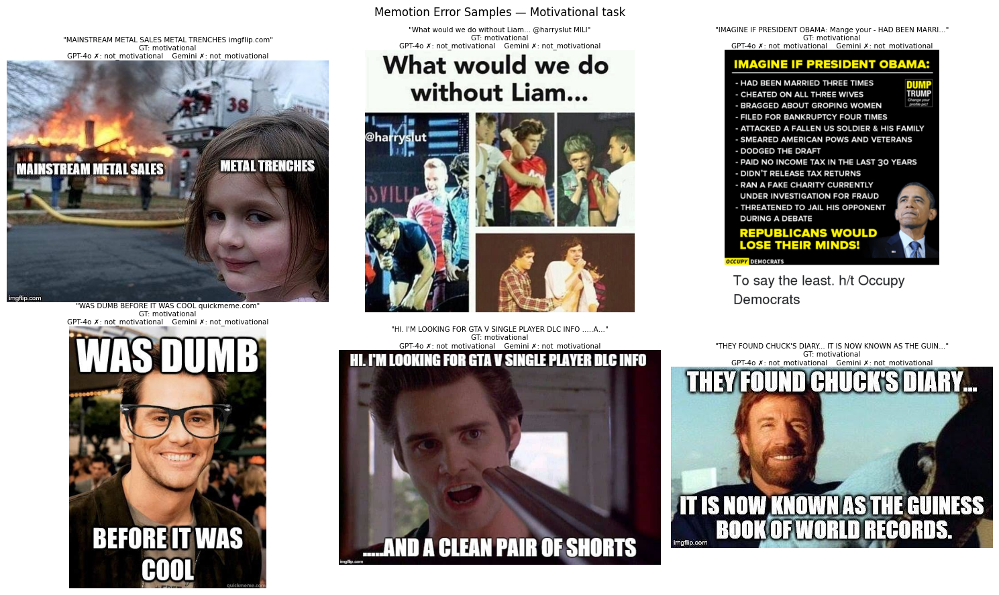

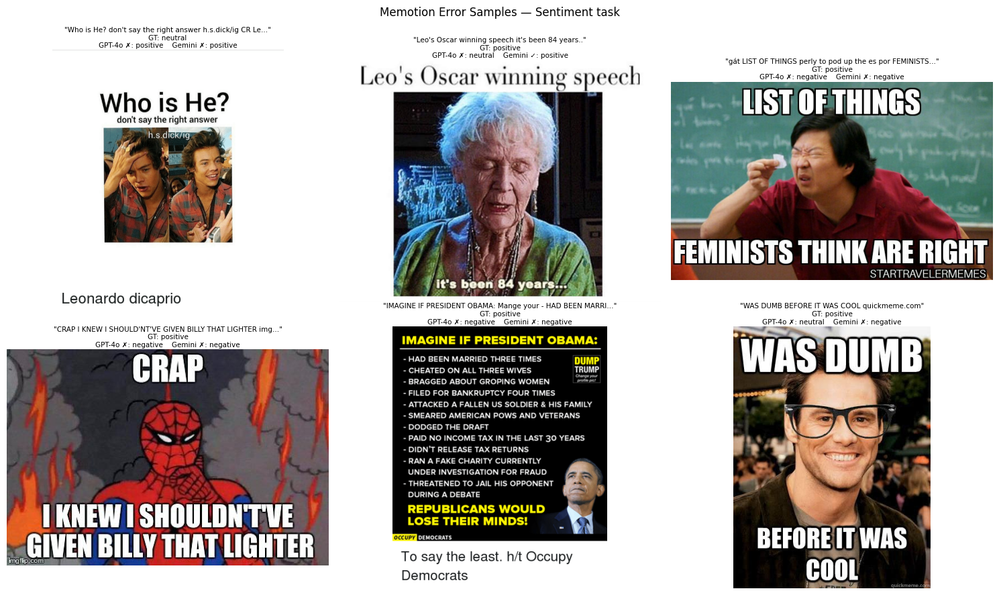

In [25]:
# ── Memotion Error Samples ────────────────────────────────────────────────────
# Per task: show up to 6 memes where at least one model is wrong

for task in MEMOTION_TASKS:
    gpt_pairs = mem_results['GPT-4o'][task['name']]
    gem_pairs = mem_results['Gemini-2.5-Flash'][task['name']]
    label_map = task['label_map']

    error_idx = [
        i for i, ((gp, gg), (ep, eg)) in enumerate(zip(gpt_pairs, gem_pairs))
        if (gp is not None and gp != gg) or (ep is not None and ep != eg)
    ]

    show_n = min(6, len(error_idx))
    if show_n == 0:
        print(f'No errors found for {task["name"]}.')
        continue

    ncols = 3
    nrows = (show_n + ncols - 1) // ncols
    fig, axes = plt.subplots(nrows, ncols, figsize=(ncols * 5, nrows * 4.5))
    axes = np.array(axes).flatten()

    for ax, idx in zip(axes[:show_n], error_idx[:show_n]):
        row = mem_samples[idx]
        img_path = os.path.join(MEMOTION_IMG_DIR, row['image_name'])
        try:
            img = PILImage.open(img_path).convert('RGB')
            ax.imshow(img)
        except Exception:
            ax.text(0.5, 0.5, '[image missing]', ha='center', va='center', transform=ax.transAxes)
        ax.axis('off')

        gt  = task['merge_fn'](row[task['col']])
        gp, _ = gpt_pairs[idx]
        ep, _ = gem_pairs[idx]

        gt_name = label_map.get(gt,  str(gt))
        gp_name = label_map.get(gp,  '?') if gp is not None else '?'
        ep_name = label_map.get(ep,  '?') if ep is not None else '?'
        gpt_mark = '✗' if gp != gt else '✓'
        gem_mark = '✗' if ep != gt else '✓'

        caption = str(row['text_corrected']) if pd.notna(row['text_corrected']) else str(row['text_ocr'])
        cap = caption[:55] + ('…' if len(caption) > 55 else '')
        title = (
            f'"{cap}"\n'
            f'GT: {gt_name}\n'
            f'GPT-4o {gpt_mark}: {gp_name}    Gemini {gem_mark}: {ep_name}'
        )
        ax.set_title(title, fontsize=7.5, pad=3)

    for ax in axes[show_n:]:
        ax.set_visible(False)

    plt.suptitle(f'Memotion Error Samples — {task["name"].capitalize()} task', fontsize=12)
    plt.tight_layout()
    plt.show()